# LAB3: Descriptors
### Please write a Python code which realize following functionality:
1. For a saw photo, e.g. saw1.jpg, specify a set of descriptors - 3pts.
2. Find an object in another photo by comparing it with the pattern - 3pts
3. For sawmovie.mp4 movie perform pattern tracking as above (for each movie frame) - 3pts.

### The task should be sent by Teams system according to the dates specified in the assignment.

#### Good luck

Mateusz Andrzejewski

---

### Created by: `Jakub Góralczyk`

---

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [2]:
plt.rcParams['figure.dpi'] = 400

In [3]:
def display_image(image):
    plt.axis('off')
    plt.imshow( cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()

In [4]:
def descriptors(image):
    image = cv2.imread(image)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    sift = cv2.SIFT_create()
    key_points = sift.detect(gray,None)
    
    image=cv2.drawKeypoints(gray,key_points,image, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    key_points, descriptors = sift.compute(gray,key_points)

    print(descriptors)
    image = cv2.resize(image,(1920,1080))
    display_image(image)
    cv2.destroyAllWindows()

In [5]:
def match(image_1:str, image_2:str):

    image_1 = cv2.imread(image_1)
    image_2 = cv2.imread(image_2)

    gray_image_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2GRAY)
    gray_image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2GRAY)

    sift = cv2.SIFT_create()    

    key_points_1, descriptors_1 = sift.detectAndCompute(gray_image_1,None)
    key_points_2, descriptors_2 = sift.detectAndCompute(gray_image_2,None)  

    bf_matcher = cv2.BFMatcher()
    matches = bf_matcher.knnMatch(descriptors_1, descriptors_2, k=2)    

    good_matches = []

    for m,n in matches:
       if m.distance < 0.75*n.distance:
           good_matches.append([m])

    output_image = cv2.drawMatchesKnn(image_1, key_points_1, image_2, key_points_2, good_matches,None
                               ,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    display_image(output_image)
    cv2.destroyAllWindows()

In [6]:
def match_video(image, video_file):
    image = cv2.imread(image)
    if image is None:
        print(f'Unable to open image at {image}')
        return

    video = cv2.VideoCapture(video_file)
    if video is None:
        print(f'Unable to open video at {video_file}')
        return

    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    orb = cv2.ORB_create()

    key_points_1, descriptors_1 = orb.detectAndCompute(gray_image,None)

    writer = cv2.VideoWriter('media\\mysaw.mp4',cv2.VideoWriter_fourcc(*'mp4v'),30,(1920,1080))

    frame_grabbed, frame = video.read()

    while frame_grabbed:
        gray_image_2  = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        key_points_2, descriptors_2 = orb.detectAndCompute(gray_image_2,None)
        
        bf_matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        
        matches = bf_matcher.match(descriptors_1, descriptors_2)
        distance = [match.distance for match in matches]
        seventh_of = (sum(distance) / len(distance)) * 0.7
        matches = [match for match in matches if match.distance < seventh_of]  


        output_image = cv2.drawMatches(image, key_points_1, frame ,key_points_2 ,matches,None
                                      ,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)


        output_image= cv2.resize(output_image,(1920,1080))

        #cv2.imshow('mysaw',output_image)

        writer.write(output_image)

        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
        frame_grabbed, frame = video.read()
    video.release()
    writer.release()
    cv2.destroyAllWindows()

[[ 0.  0.  0. ... 19. 24. 14.]
 [ 8. 30. 83. ... 15. 26.  4.]
 [83. 17.  2. ... 87. 49. 67.]
 ...
 [ 0.  0.  0. ... 18. 20. 24.]
 [ 7.  8. 40. ... 13. 19. 18.]
 [15. 27. 17. ...  0.  0.  0.]]


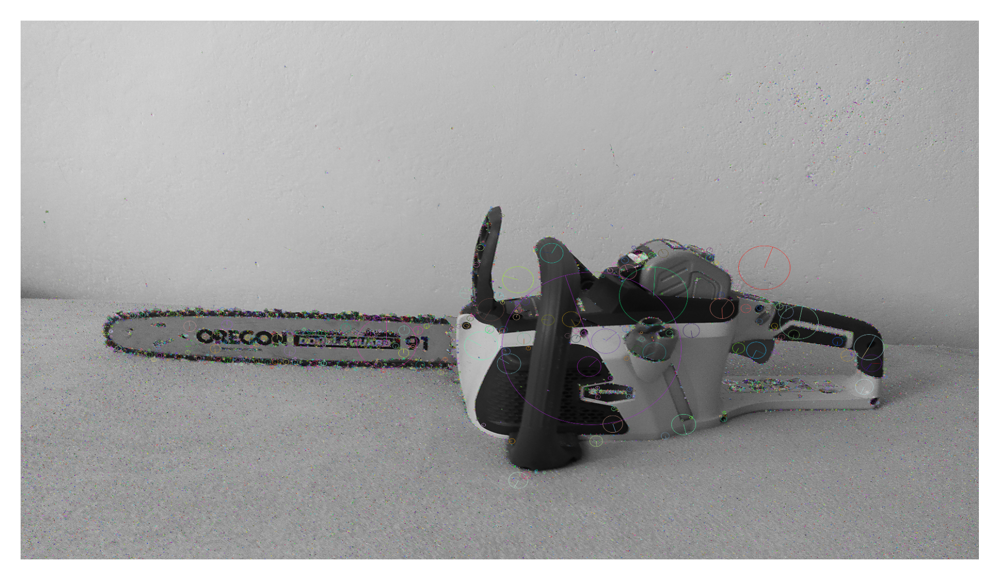

In [7]:
descriptors('media\\saw1.jpg')

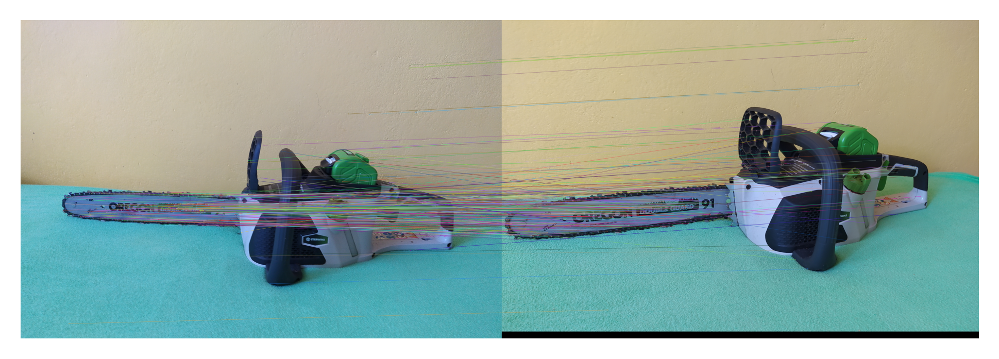

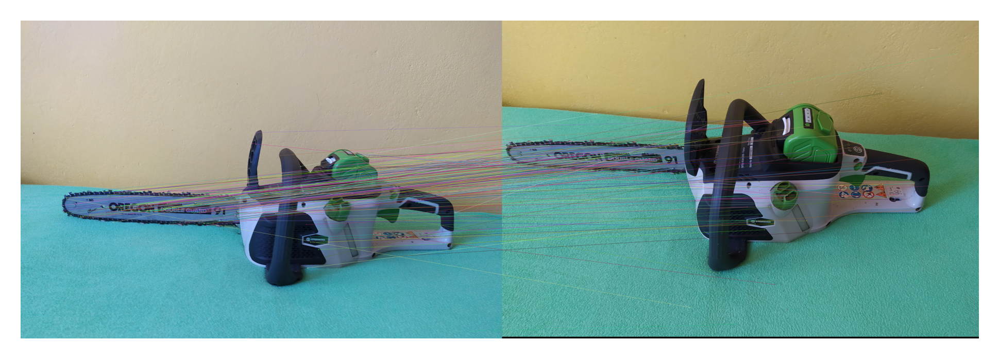

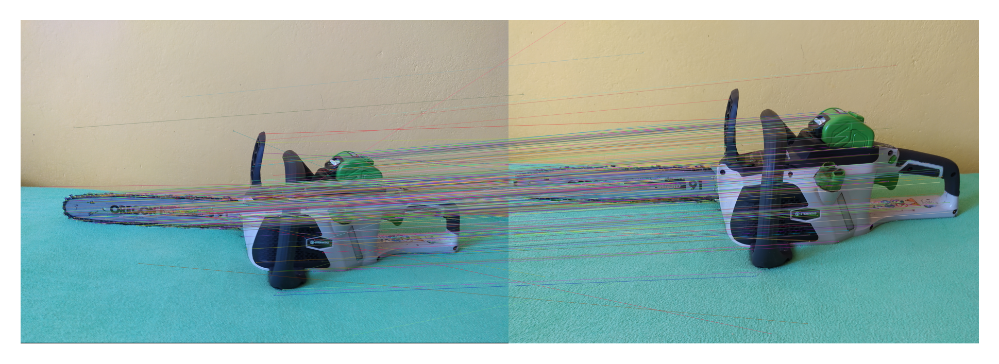

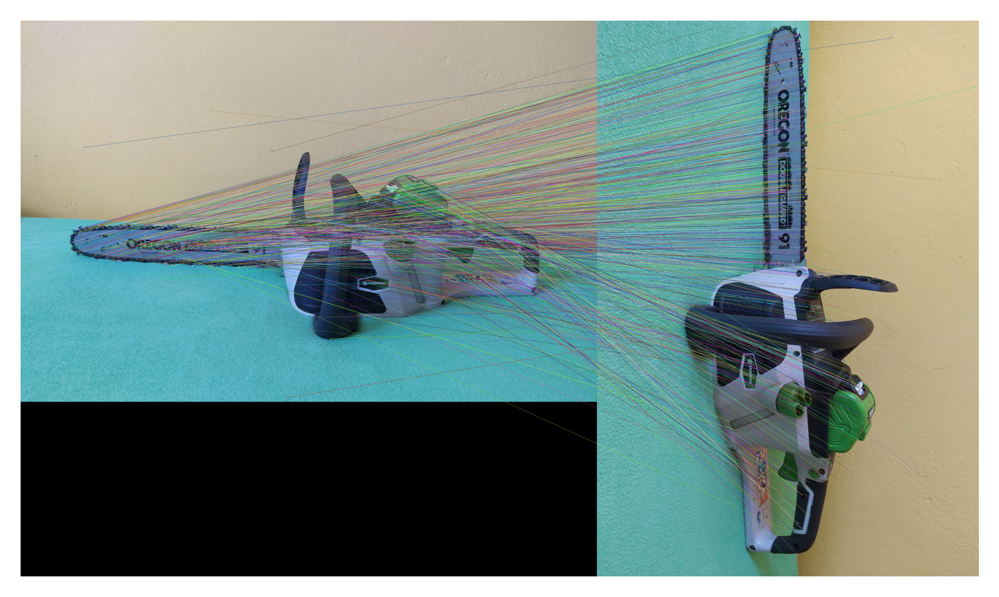

In [8]:
match('media\\saw1.jpg','media\\saw2.jpg')
match('media\\saw1.jpg','media\\saw3.jpg')
match('media\\saw1.jpg','media\\saw4.jpg')
match('media\\saw1.jpg','media\\saw4a.jpg')

In [9]:
match_video('media\\saw1.jpg','media\\sawmovie.mp4')